# Modeling


Here I will assemble a simple, baselime model using a limited number of features. This will serve as a starting benchmark to build upon. Later, I will add in more advanced features and validate hyperparameters. 

In [81]:
# munging data
import pandas as pd
import numpy as np

# EDA and visualization
import seaborn as sns 
import matplotlib.pyplot as plt
sns.set()

# sampling
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

# models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import xgboost as xgb

# modeling tools
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, f1_score, confusion_matrix, roc_auc_score, precision_recall_curve
from sklearn.preprocessing import StandardScaler

# for xgboost
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [60]:
# removing limit on number of columns to display 

pd.set_option('display.max_columns', None)

### Merging two main dataframes

In [4]:
# importing data

spotify = pd.read_csv('data/spotify_album_features.csv', index_col='Unnamed: 0')
pfork_lastfm = pd.read_csv('data/lastfm_data-pitchfork_artists_only.csv', index_col='Unnamed: 0')

In [5]:
print(len(pfork_lastfm))
pfork_lastfm.columns

18391


Index(['album_review_score', 'artist', 'album_title', 'best_new_music',
       'review_pub_date', 'review_pub_year', 'album_release_year',
       'album_genre', 'label', 'review_author', 'reviewid', 'review_delay',
       'api_formatted', 'mbid', 'artist_mb', 'artist_lastfm', 'country_mb',
       'country_lastfm', 'tags_mb', 'tags_lastfm', 'listeners_lastfm',
       'scrobbles_lastfm', 'ambiguous_artist', 'artist_mb_clean'],
      dtype='object')

In [6]:
print(len(spotify))
spotify.head(3)

14080


,album_id_,album_artist_,genre_mode,genre_nunique,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,artist_name_clean
0,001hiwQqutaP5krx5mhqh6,"the singles, goldfrapp","['alternative dance', 'art pop', 'big beat', '...",1,4.0,1,4.00,5.0,8,0.547786,0.074893,0.500000,0.518875,0.598429,0.125500,-8.819071,1.447097,0.034100,0.008321,0.237058,0.308059,0.218491,0.279913,0.123186,0.071950,0.339929,0.181419,130.067429,20.769645,3289135.0,234938.214286,29403.680641,14,goldfrapp
1,001nBu0rExsOq3m5YD3LSr,"an exaltation of laarks, laarks","['eau claire indie', 'jangle rock']",1,4.0,3,3.90,7.0,7,0.293500,0.141420,0.900000,0.316228,0.640040,0.236476,-8.088300,3.570054,0.047100,0.013740,0.236717,0.315854,0.126050,0.278644,0.246010,0.201607,0.283700,0.103473,129.331200,35.949493,2415654.0,241565.400000,62816.266119,10,laarks
2,002J3rMJ7A9okPjkxdB59t,"where shine new lights, tara jane o'neil","['freak folk', 'slowcore']",1,4.0,3,3.75,9.0,7,0.234933,0.098007,0.583333,0.514929,0.107592,0.066746,-20.843583,4.682872,0.040192,0.006008,0.892667,0.197663,0.687333,0.294175,0.122167,0.048765,0.052875,0.035054,105.190667,31.924222,2270212.0,189184.333333,62175.526906,12,tara jane o'neil


In [7]:
# merging dfs

merged_df = spotify.merge(pfork_lastfm, how='inner', left_on='album_artist_', right_on='api_formatted')
len(merged_df)

14116

In [8]:
merged_df.describe()

,genre_nunique,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,reviewid,review_delay,listeners_lastfm,scrobbles_lastfm
count,14116.0,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,1.411600e+04,1.411600e+04,1.411600e+04,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,14116.000000,1.270500e+04,1.270500e+04
mean,1.0,3.972230,1.969396,3.862072,4.950482,6.522315,0.480655,0.121395,0.665814,0.424378,0.610233,0.161290,-9.308042,2.515511,0.084008,0.049137,0.301646,0.206075,0.314600,0.208464,0.202204,0.126888,0.398700,0.185943,120.440324,26.535540,2.888083e+06,2.681670e+05,8.478924e+04,11.830618,6.983919,0.054690,2008.984061,2007.962383,12752.527345,1.021678,3.905281e+05,1.374112e+07
std,0.0,0.187667,0.811482,0.199561,3.662511,1.814258,0.146224,0.043229,0.204212,0.141399,0.195741,0.065275,3.998134,1.633945,0.078637,0.055065,0.253210,0.113723,0.286627,0.134339,0.096039,0.069084,0.178018,0.067101,13.090911,9.224817,1.063170e+06,1.841189e+05,8.496651e+04,3.922577,1.296164,0.227382,4.593758,6.796558,6268.810814,5.311917,6.840086e+05,3.912380e+07
min,1.0,0.000000,1.000000,1.000000,0.000000,1.000000,0.060800,0.000000,0.000000,0.000000,0.000190,0.000000,-57.006000,0.000000,0.021525,0.000000,0.000001,0.000000,0.000000,0.000000,0.037700,0.000000,0.014600,0.000000,57.592000,0.000000,2.210000e+04,2.210000e+04,0.000000e+00,1.000000,0.000000,0.000000,1999.000000,1959.000000,1.000000,-2.000000,0.000000e+00,0.000000e+00
25%,1.0,4.000000,1.000000,3.777778,1.000000,5.000000,0.381237,0.093015,0.538462,0.403113,0.481882,0.116176,-11.233833,1.411302,0.040329,0.011095,0.097048,0.116303,0.055807,0.075037,0.142721,0.077736,0.268372,0.146017,112.206813,21.017326,2.296819e+06,2.018556e+05,4.524538e+04,10.000000,6.400000,0.000000,2005.000000,2005.000000,8128.750000,0.000000,2.732200e+04,3.074690e+05
50%,1.0,4.000000,2.000000,3.916667,5.000000,7.000000,0.480847,0.118443,0.666667,0.483046,0.636600,0.159063,-8.593250,2.143396,0.055185,0.026654,0.231449,0.222505,0.231315,0.237807,0.180159,0.115515,0.398892,0.190657,120.551583,27.040271,2.676206e+06,2.357750e+05,6.444962e+04,11.000000,7.200000,0.000000,2009.000000,2009.000000,13352.500000,0.000000,1.143320e+05,1.675663e+06
75%,1.0,4.000000,2.000000,4.000000,9.000000,8.000000,0.582280,0.146186,0.818182,0.513553,0.757021,0.205118,-6.578882,3.194003,0.091561,0.069611,0.455868,0.294620,0.547401,0.323148,0.234684,0.174083,0.525632,0.232018,128.622182,32.519738,3.321296e+06,2.818003e+05,9.454140e+04,14.000000,7.800000,0.000000,2013.000000,2013.000000,18064.250000,0.000000,4.127050e+05,8.816427e+06
max,1.0,5.000000,5.000000,5.000000,11.000000,12.000000,0.958000,0.382559,1.000000,0.707107,0.999000,0.495928,4.078000,27.119363,0.958000,0.440255,0.995750,0.640872,0.963700,0.631658,0.976000,0.457811,0.964000,0.484487,193.244000,84.098739,2.289121e+07,4.528587e+06,2.238399e+06,20.000000,10.000000,1.000000,2017.000000,2017.000000,22725.000000,56.000000,5.381567e+06,5.171263e+08


In [9]:
# dropping a few columns that are no longer relevant

merged_df.drop(['genre_nunique','api_formatted', 'mbid', 'artist_lastfm', 'reviewid', 'album_id_', 'artist_mb'], axis=1, inplace=True)

In [180]:
# saving album features as a csv

merged_df.to_csv('data/full_merged_raw_df.csv')

### Setting target

There are two natural choices for target variables, either a) above/below average review score, or b) whether or not a album was designated 'best new music'. Let's look at data here a bit to determine which might be a better choice.

#### Review score

In [181]:
df = pd.read_csv('data/full_merged_raw_df.csv', index_col='Unnamed: 0')

In [12]:
df.album_review_score.describe()

count    14116.000000
mean         6.983919
std          1.296164
min          0.000000
25%          6.400000
50%          7.200000
75%          7.800000
max         10.000000
Name: album_review_score, dtype: float64

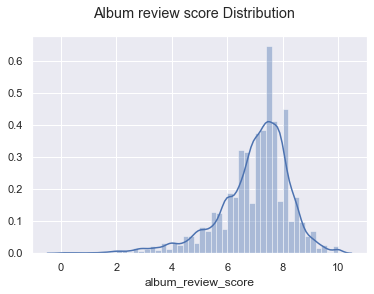

In [13]:
sns.distplot(df.album_review_score)
plt.suptitle('Album review score Distribution');

In [14]:
print(df.album_review_score.mean())
print(df.album_review_score.median())

6.983918957211674
7.2


The distribution is normal but skewed a bit to the left. the mean is 6.983918957211681 and the median is 7.2. Since the scores round to the nearest 0.1, if we use review score as our classifier we could divide at <7 vs >=7. Let's add a column designating this. 

In [15]:
df['seven_plus'] = df.album_review_score.apply([lambda x: 1 if x >= 7 else 0])

In [16]:
# checking that that the column properly captured only scores of 7+

df[(df.seven_plus == 0) & (df.album_review_score >= 7)][['seven_plus', 'album_review_score']]

,seven_plus,album_review_score


In [17]:
df[(df.seven_plus) == 1 & (df.album_review_score < 7)][['seven_plus', 'album_review_score']]

,seven_plus,album_review_score


In [18]:
# summary stats for albums with score above 7

df[df.seven_plus == 1].describe()

,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm,seven_plus
count,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8.472000e+03,8.472000e+03,8.472000e+03,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,8472.000000,7.600000e+03,7.600000e+03,8472.0
mean,3.967776,2.008144,3.852179,4.963055,6.470609,0.470558,0.121196,0.663883,0.424420,0.597415,0.161442,-9.683005,2.582768,0.085069,0.050189,0.320991,0.206733,0.341987,0.212459,0.202537,0.126515,0.389862,0.182706,120.004437,26.599643,2.929213e+06,2.794065e+05,9.107602e+04,11.789424,7.783676,0.090534,2009.040250,2007.523017,1.517233,3.629116e+05,1.330344e+07,1.0
std,0.202161,0.820327,0.208186,3.655115,1.868877,0.152170,0.044629,0.205477,0.143087,0.202021,0.066751,4.190984,1.707607,0.078371,0.056080,0.262943,0.115122,0.293860,0.133654,0.098430,0.069879,0.186215,0.069842,13.414139,9.383233,1.134623e+06,2.122759e+05,9.553886e+04,4.138043,0.584494,0.286962,4.656356,7.704046,6.522099,6.349397e+05,3.985508e+07,0.0
min,1.000000,1.000000,1.000000,0.000000,1.000000,0.060800,0.000000,0.000000,0.000000,0.000190,0.000000,-57.006000,0.000000,0.021525,0.000000,0.000001,0.000000,0.000000,0.000000,0.037700,0.000000,0.014600,0.000000,57.592000,0.000000,2.210000e+04,2.210000e+04,0.000000e+00,1.000000,7.000000,0.000000,1999.000000,1959.000000,-2.000000,0.000000e+00,0.000000e+00,1.0
25%,4.000000,1.000000,3.750000,2.000000,5.000000,0.364620,0.091870,0.538462,0.404520,0.459069,0.116382,-11.753975,1.439039,0.040876,0.011079,0.103847,0.115665,0.069020,0.082227,0.141076,0.076245,0.246856,0.140648,111.670637,21.106870,2.295822e+06,2.012261e+05,4.692315e+04,10.000000,7.300000,0.000000,2005.000000,2004.000000,0.000000,2.817300e+04,3.405050e+05,1.0
50%,4.000000,2.000000,3.909091,5.000000,6.000000,0.469899,0.118404,0.666667,0.483046,0.619448,0.158840,-8.941372,2.194130,0.056428,0.027295,0.252887,0.222499,0.274384,0.243246,0.179225,0.115470,0.387592,0.188234,120.129742,27.140291,2.689774e+06,2.384902e+05,6.765381e+04,11.000000,7.700000,0.000000,2009.000000,2009.000000,0.000000,1.118430e+05,1.683344e+06,1.0
75%,4.000000,2.000000,4.000000,9.000000,8.000000,0.575222,0.147049,0.818182,0.514496,0.750233,0.205812,-6.820937,3.270220,0.094137,0.071655,0.492256,0.296451,0.599546,0.326069,0.235695,0.175005,0.524762,0.230750,128.440150,32.626871,3.374131e+06,2.925604e+05,1.011824e+05,14.000000,8.100000,0.000000,2013.000000,2013.000000,0.000000,3.859252e+05,8.487359e+06,1.0
max,5.000000,5.000000,5.000000,11.000000,12.000000,0.939000,0.382559,1.000000,0.707107,0.999000,0.481756,4.078000,27.119363,0.958000,0.440255,0.995750,0.640872,0.963700,0.631658,0.976000,0.457811,0.923455,0.411119,180.013000,72.549371,2.289121e+07,4.528587e+06,2.238399e+06,20.000000,10.000000,1.000000,2017.000000,2017.000000,56.000000,5.381567e+06,5.171263e+08,1.0


In [19]:
df.groupby('seven_plus').mean()

,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm
seven_plus,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,3.978916,1.911233,3.876921,4.931609,6.599929,0.495810,0.121692,0.668713,0.424314,0.629474,0.161061,-8.745200,2.414553,0.082415,0.047557,0.272607,0.205087,0.273490,0.202468,0.201704,0.127449,0.411967,0.190802,121.094618,26.439316,2.826344e+06,251295.904393,75352.398290,11.892452,5.783434,0.000886,2008.899717,2008.621899,0.277817,431641.689912,1.439272e+07
1,3.967776,2.008144,3.852179,4.963055,6.470609,0.470558,0.121196,0.663883,0.424420,0.597415,0.161442,-9.683005,2.582768,0.085069,0.050189,0.320991,0.206733,0.341987,0.212459,0.202537,0.126515,0.389862,0.182706,120.004437,26.599643,2.929213e+06,279406.458900,91076.016906,11.789424,7.783676,0.090534,2009.040250,2007.523017,1.517233,362911.623421,1.330344e+07


What features show decent separation between classes?  

Well reviewed albums are...
* slightly longer average track length and have more variation in track lengths
* slightly sadder (lower valence)
* moderately more instrumental (+16%)
* slightly more acoustic (+5%)
* slightly quieter
* slightly lower energy (-3%)
* slightly less danceable (-2%)
* less last fm listeners by artist and less scrobles

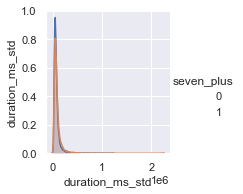

In [20]:
sample = df[['seven_plus', 'duration_ms_std']]

sns.pairplot(sample, hue='seven_plus', plot_kws=dict(alpha=.3, edgecolor='none'));

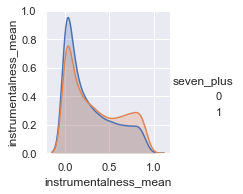

In [21]:
sample = df[['seven_plus', 'instrumentalness_mean']]

sns.pairplot(sample, hue='seven_plus', plot_kws=dict(alpha=.3, edgecolor='none'));

#### Best new music

In addition to getting a good review score, some albums are designated to be "Best New Music" by Pitchfork. Let's examine this feature a bit more. Since this accolade only began in 2003, we will have to drop all reviews that were written before then. 

One issue here is there is significant class imbalance between BNM (n=772) and non-BMN (n=12013). If we go this route, we will have to do some weighting and oversampling later.

In [22]:
# ONLY BNM albums

df.drop(df[df.review_pub_year < 2003].index)[df.best_new_music == 1].describe()

<ipython-input-22-6f4a5acec906>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.drop(df[df.review_pub_year < 2003].index)[df.best_new_music == 1].describe()


,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm,seven_plus
count,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,772.000000,7.720000e+02,7.720000e+02,7.720000e+02,772.000000,772.000000,772.0,772.000000,772.000000,772.000000,7.190000e+02,7.190000e+02,772.000000
mean,3.983161,2.022021,3.862855,5.134715,6.870466,0.476705,0.125596,0.666552,0.425835,0.610522,0.171364,-9.397068,2.628594,0.087173,0.052937,0.311329,0.218183,0.305191,0.217004,0.205533,0.135370,0.400355,0.192273,120.231174,26.861958,3.233610e+06,2.723715e+05,9.720095e+04,12.765544,8.657124,1.0,2010.615285,2007.029793,3.585492,7.864535e+05,3.157933e+07,0.993523
std,0.138461,0.829597,0.187865,3.689644,1.816143,0.145844,0.042809,0.198698,0.139439,0.185263,0.064858,3.942845,1.572338,0.076200,0.056168,0.245619,0.110271,0.275474,0.129259,0.085120,0.069454,0.169365,0.063942,12.337089,8.828087,1.403587e+06,1.588551e+05,1.389195e+05,4.193220,0.487577,0.0,3.814903,9.543016,9.854542,8.789629e+05,5.033569e+07,0.080269
min,3.000000,1.000000,3.000000,0.000000,1.000000,0.086438,0.000000,0.000000,0.000000,0.019668,0.000000,-28.475000,0.000000,0.028680,0.000000,0.000018,0.000000,0.000000,0.000000,0.062140,0.000000,0.034625,0.000000,73.923333,0.000000,2.534530e+05,6.812675e+04,0.000000e+00,1.000000,3.500000,1.0,2003.000000,1959.000000,-1.000000,2.479000e+03,8.657000e+03,0.000000
25%,4.000000,1.000000,3.775641,2.000000,6.000000,0.381931,0.097804,0.545455,0.404168,0.494225,0.127259,-11.279067,1.482435,0.042795,0.013148,0.113901,0.135647,0.062665,0.097895,0.150092,0.086602,0.280771,0.154826,112.484184,21.658140,2.453483e+06,2.094335e+05,4.959152e+04,10.000000,8.400000,1.0,2008.000000,2005.000000,0.000000,1.993575e+05,4.206935e+06,1.000000
50%,4.000000,2.000000,3.909091,5.000000,7.000000,0.474000,0.122685,0.666667,0.483046,0.624673,0.167647,-8.739971,2.251928,0.057306,0.030635,0.245274,0.236550,0.225949,0.249213,0.185323,0.124525,0.398407,0.196055,120.211500,27.487950,2.926280e+06,2.413392e+05,7.152576e+04,12.000000,8.600000,1.0,2011.000000,2010.000000,0.000000,4.378740e+05,1.210360e+07,1.000000
75%,4.000000,2.000000,4.000000,9.000000,8.000000,0.583956,0.150603,0.812500,0.512348,0.749406,0.214804,-6.761982,3.408304,0.095230,0.076973,0.456660,0.299159,0.523003,0.323125,0.242789,0.180288,0.519321,0.234131,128.340719,32.743286,3.719303e+06,2.899703e+05,1.048131e+05,16.000000,8.900000,1.0,2014.000000,2013.000000,0.000000,1.049237e+06,3.995478e+07,1.000000
max,5.000000,5.000000,4.333333,11.000000,11.000000,0.842182,0.284552,1.000000,0.707107,0.990400,0.384945,2.986125,10.912335,0.943429,0.376770,0.995750,0.640872,0.956250,0.449805,0.806286,0.409557,0.862000,0.397783,162.202714,55.267967,2.289121e+07,2.256006e+06,2.238399e+06,20.000000,10.000000,1.0,2016.000000,2016.000000,50.000000,4.732528e+06,4.995488e+08,1.000000


In [23]:
# albums that did NOT receive BNM distinction

df.drop(df[df.review_pub_year < 2003].index)[df.best_new_music == 0].describe()

<ipython-input-23-b279970e875a>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.drop(df[df.review_pub_year < 2003].index)[df.best_new_music == 0].describe()


,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm,seven_plus
count,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,12013.000000,1.201300e+04,1.201300e+04,1.201300e+04,12013.000000,12013.000000,12013.0,12013.000000,12013.000000,12013.000000,1.080600e+04,1.080600e+04,12013.000000
mean,3.971697,1.956797,3.864071,4.938567,6.507117,0.481069,0.120715,0.662720,0.425897,0.614396,0.159634,-9.189492,2.471859,0.084314,0.048980,0.299292,0.203748,0.313574,0.206246,0.202227,0.126371,0.399002,0.185121,120.542727,26.454015,2.849520e+06,2.680275e+05,8.280082e+04,11.728378,6.888221,0.0,2009.756597,2008.826688,0.929909,3.618362e+05,1.239631e+07,0.577208
std,0.188404,0.806679,0.199508,3.658575,1.817393,0.147340,0.043129,0.204773,0.140714,0.195305,0.065032,3.960899,1.617163,0.078496,0.054821,0.254390,0.113789,0.288201,0.134953,0.097003,0.068949,0.179260,0.067557,13.151817,9.276336,1.024453e+06,1.901456e+05,7.983814e+04,3.899874,1.202273,0.0,4.002853,6.404471,5.072165,6.541042e+05,3.761352e+07,0.494024
min,0.000000,1.000000,1.000000,0.000000,1.000000,0.060800,0.000000,0.000000,0.000000,0.000190,0.000000,-57.006000,0.000000,0.021525,0.000000,0.000001,0.000000,0.000000,0.000000,0.037700,0.000000,0.014600,0.000000,57.592000,0.000000,2.210000e+04,2.210000e+04,0.000000e+00,1.000000,0.000000,0.0,2003.000000,1960.000000,-2.000000,0.000000e+00,0.000000e+00,0.000000
25%,4.000000,1.000000,3.777778,1.000000,5.000000,0.380909,0.092614,0.533333,0.404520,0.487312,0.114394,-11.061900,1.384503,0.040358,0.011091,0.094163,0.112194,0.053706,0.071461,0.142414,0.077334,0.268092,0.144759,112.293636,20.908840,2.277204e+06,2.015700e+05,4.427108e+04,10.000000,6.300000,0.0,2006.000000,2006.000000,0.000000,2.545050e+04,2.811748e+05,0.000000
50%,4.000000,2.000000,3.916667,5.000000,7.000000,0.482111,0.117875,0.666667,0.483046,0.641250,0.157310,-8.464545,2.109219,0.055364,0.026716,0.226874,0.219452,0.227357,0.234880,0.179662,0.114825,0.399500,0.190008,120.694000,26.973587,2.648333e+06,2.346898e+05,6.319167e+04,11.000000,7.100000,0.0,2010.000000,2009.000000,0.000000,1.005940e+05,1.457286e+06,1.000000
75%,4.000000,2.000000,4.000000,8.000000,8.000000,0.584133,0.145179,0.818182,0.514496,0.759700,0.203710,-6.482462,3.135313,0.091938,0.069221,0.453080,0.293142,0.547208,0.322011,0.234736,0.173295,0.526700,0.231395,128.724769,32.476125,3.274586e+06,2.799920e+05,9.202897e+04,14.000000,7.700000,0.0,2013.000000,2013.000000,0.000000,3.687350e+05,7.461598e+06,1.000000
max,5.000000,5.000000,5.000000,11.000000,12.000000,0.958000,0.382559,1.000000,0.707107,0.999000,0.495928,4.078000,27.119363,0.958000,0.440255,0.994000,0.612496,0.963700,0.631658,0.976000,0.427446,0.964000,0.484487,193.244000,84.098739,1.808235e+07,4.528587e+06,1.346058e+06,20.000000,10.000000,0.0,2017.000000,2017.000000,56.000000,5.381567e+06,5.171263e+08,1.000000


In [24]:
df.drop(df[df.review_pub_year < 2003].index).groupby('best_new_music').mean()

,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm,seven_plus
best_new_music,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,3.971697,1.956797,3.864071,4.938567,6.507117,0.481069,0.120715,0.662720,0.425897,0.614396,0.159634,-9.189492,2.471859,0.084314,0.048980,0.299292,0.203748,0.313574,0.206246,0.202227,0.126371,0.399002,0.185121,120.542727,26.454015,2.849520e+06,268027.496052,82800.816634,11.728378,6.888221,2009.756597,2008.826688,0.929909,361836.162502,1.239631e+07,0.577208
1,3.983161,2.022021,3.862855,5.134715,6.870466,0.476705,0.125596,0.666552,0.425835,0.610522,0.171364,-9.397068,2.628594,0.087173,0.052937,0.311329,0.218183,0.305191,0.217004,0.205533,0.135370,0.400355,0.192273,120.231174,26.861958,3.233610e+06,272371.530748,97200.948357,12.765544,8.657124,2010.615285,2007.029793,3.585492,786453.479833,3.157933e+07,0.993523


Best new music mean reviews score: 8.657124
Non-BNM mean score: 6.887118

Albums that have been awarded "best new music" are/have...  

* very slightly more likely to have multiple time signatures
* slightly more likely to use more total number of keys (across all the songs)
* 1% less dancy
* have very slightly more variation in energy levels
* are slightly quieter and have slightly more variation in volume
* very slightly (2%) more acoustic
* 1% less instrumental
* 1% less happy
* have slightly more variation in individual song durations
* higher number of tracks on average (+1)
* much more likely to be reviewed with significant delay from album release date (avg 3.5 years late, vs <1 year for non-BNM
* nearly 2x more lastfm listenerers by artist and 3x more scrobles

**Strongest correlation by far is with artist-level last.fm listenership.** This will make it difficult to predict new artists without much preexisting clout on this platform, but it will provide a lot of separation for established artists. 

Release delay may be helpful  as well, but I will have to think about whether or not there are factors that may make this less meaningful. 

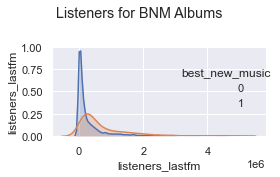

In [25]:
sample = df.drop(df[df.review_pub_year < 2003].index)[['best_new_music', 'listeners_lastfm']]

sns.pairplot(sample, hue='best_new_music', plot_kws=dict(alpha=.3, edgecolor='none'))
plt.suptitle('Listeners for BNM Albums')
plt.tight_layout()
plt.xticks(rotation=90)
plt.savefig('viz/bnm_listeners.svg');

''

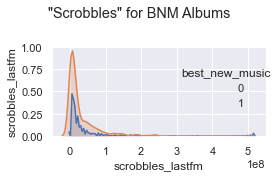

In [26]:
sample = df.drop(df[df.review_pub_year < 2003].index)[['best_new_music', 'scrobbles_lastfm']]

sns.pairplot(sample, hue='best_new_music', plot_kws=dict(alpha=.3, edgecolor='none'))
plt.suptitle('"Scrobbles" for BNM Albums')
plt.tight_layout()
plt.savefig('viz/bnm_scrobles.svg')
;

#### Target Selection Conclusion

Since Last.fm listens and scrobbles provide more separation for BNM albums than any feature provides for <7 albums, I am choosing BNM as my target variable. Now to just clean the data frame up a little to optimize it for this target and key feature.

In [27]:
# dropping pre-2003 reviews since they will no longer be relevant to target

df_bnm = df.drop(df[df.review_pub_year < 2003].index)
print(len(df_bnm))


12785


In [28]:
# dropping rows with no last.fm data since those are the working key feature

df_bnm.dropna(subset=['scrobbles_lastfm','listeners_lastfm'], inplace=True)

In [182]:
# saving album features as a csv

df_bnm.to_csv('data/full_merged_clean_df.csv')

### Baseline MVP model

Baseline model achieved better results without scaling so I won't scale for now. 

In [3]:
df_bnm = pd.read_csv('data/full_merged_clean_df.csv', index_col='Unnamed: 0')

In [82]:
X = df_bnm[['scrobbles_lastfm','listeners_lastfm']]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

kf = KFold(n_splits=5, random_state=17, shuffle=True)

logit1 = LogisticRegression()
logit1.fit(X_train, y_train)
logit1_preds = logit1.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit1, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit1, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit1, X_train, y_train, cv=kf, scoring='recall')
f1 = cross_val_score(logit1, X_train, y_train, cv=kf, scoring='f1')
roc_auc = cross_val_score(logit1, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))


Baseline logistic regression classification metrics:

mean accuracy:   93.57%
mean precision:   0.00%
mean recall:      0.00%
mean f1:          0.00%
mean ROC AUC:     0.252


The baseline model has a 93% accuracy, but that isn't the most helpful indicator since we have severely imbalanced classes, so let's look at the confusion matrix and calculate F1. 

In [30]:
logit1_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit1_preds)
logit1_conf_mat

array([[1728,    1],
       [ 115,    0]])

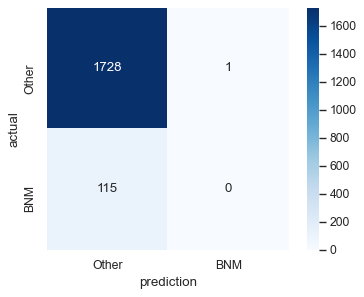

In [31]:
plt.figure(dpi=80)
sns.heatmap(logit1_conf_mat, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['Other', 'BNM'],
           yticklabels=['Other', 'BNM']);
plt.xlabel('prediction')
plt.ylabel('actual');

In [32]:
logit1.predict_proba(X_val)

array([[0.51705881, 0.48294119],
       [0.52273632, 0.47726368],
       [0.60023443, 0.39976557],
       ...,
       [0.50069779, 0.49930221],
       [0.993329  , 0.006671  ],
       [0.53027387, 0.46972613]])

This isn't the best starting point, but hopefullly it will improve after adding a few more features. 

Predicted probabilities are right near the threshold, so later I will most likely have to drop the decision threshold down a bit to capture more positives.

## Feature engineering

### Label
#### Adding Feature

Since there are a ton of labels, rather than using OHE, I'm going to create a feature called 'label strength' that will be an integer that represents the number of BNM albums each album's record label has released. This will give weight to albums released on record labels that are favored by the critics at Pitchfork. 

In [33]:
df_bnm[df_bnm.best_new_music == 1].label.value_counts()

domino          32
4ad             25
sub pop         22
warp            19
matador         18
                ..
stax             1
ato              1
dirtnap          1
other people     1
caldo verde      1
Name: label, Length: 287, dtype: int64

In [34]:
label_strength_dict = df_bnm[df_bnm.best_new_music == 1].label.value_counts().to_dict()

In [35]:
df_bnm['label_strength'] = df_bnm.label.apply(lambda x: label_strength_dict[x] if x in label_strength_dict.keys() else 0)

In [36]:
df_bnm[df_bnm.label=='domino'][['label','label_strength']].head()

,label,label_strength
24,domino,32
128,domino,32
166,domino,32
209,domino,32
431,domino,32


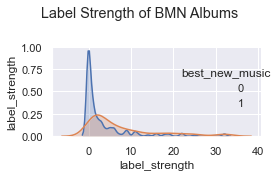

In [64]:
sample = df_bnm[['best_new_music', 'label_strength']]

sns.pairplot(sample, hue='best_new_music', plot_kws=dict(alpha=.3, edgecolor='none'))
plt.suptitle('Label Strength of BMN Albums')
plt.tight_layout()
plt.savefig('viz/label_strength.svg')


#### Testing feature

In [38]:
X = df_bnm.loc[:,['scrobbles_lastfm','listeners_lastfm', 'label_strength']]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit2 = LogisticRegression()
logit2.fit(X_train, y_train)
logit2_preds = logit2.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit2, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit2, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit2, X_train, y_train, cv=kf, scoring='recall')
roc_auc = cross_val_score(logit2, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))

logit2_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit2_preds)
print('\nConfusion Matrix:\n',logit2_conf_mat)

Baseline logistic regression classification metrics:

mean accuracy:   93.57%
mean precision:   0.00%
mean recall:      0.00%
mean f1:          0.00%
mean ROC AUC:     0.252

Confusion Matrix:
 [[1728    1]
 [ 115    0]]


Not a huge gain, but that's one more positive class predition than the previous iteration. 

### Genre
#### Adding feature

To start I will break out dummy variables for the genres of each record.

In [39]:
df_bnm = pd.concat([df_bnm,pd.get_dummies(df_bnm['album_genre'], prefix='album_genre')],axis=1)

Examining how genre effects sonic quality features. 

In [40]:
# mean values by genre 

df.groupby('album_genre').mean()

,time_signature_mode,time_signature_nunique,time_signature_mean,key_mode,key_nunique,danceability_mean,danceability_std,mode_mean,mode_std,energy_mean,energy_std,loudness_mean,loudness_std,speechiness_mean,speechiness_std,acousticness_mean,acousticness_std,instrumentalness_mean,instrumentalness_std,liveness_mean,liveness_std,valence_mean,valence_std,tempo_mean,tempo_std,duration_ms_sum,duration_ms_mean,duration_ms_std,track_id_count,album_review_score,best_new_music,review_pub_year,album_release_year,review_delay,listeners_lastfm,scrobbles_lastfm,seven_plus
album_genre,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Other,3.971530,1.992883,3.854904,5.112456,6.537367,0.464171,0.118685,0.648889,0.433450,0.620175,0.155649,-9.544716,2.439917,0.087576,0.048420,0.307203,0.192688,0.389563,0.221934,0.198941,0.125780,0.386126,0.176998,120.776929,26.693237,2.981789e+06,271590.791235,91939.791160,12.042705,6.980000,0.018505,2010.108185,2009.225623,0.882562,48275.137255,1.103648e+06,0.613523
electronic,3.978506,1.959400,3.882508,5.033436,6.622996,0.533042,0.131700,0.605706,0.452907,0.624420,0.162092,-9.903085,2.641957,0.083040,0.057463,0.267387,0.210401,0.444963,0.247267,0.194880,0.128653,0.399115,0.199529,121.748115,24.296864,3.005316e+06,287399.563444,87377.728555,11.472194,6.873149,0.052201,2008.728079,2008.166496,0.561583,379470.715076,1.048902e+07,0.559195
experimental,3.920302,2.273490,3.786166,5.088926,5.914430,0.378585,0.123856,0.655529,0.424331,0.564473,0.171977,-11.022446,3.068419,0.084418,0.054819,0.395086,0.220820,0.490873,0.250256,0.205699,0.126612,0.294409,0.168305,116.568709,27.543853,2.854905e+06,354513.830996,133893.463326,10.254195,7.346477,0.075503,2008.709732,2007.676174,1.033557,170804.124884,4.842314e+06,0.719799
folk/country,3.942486,2.133581,3.791598,5.133581,6.289425,0.468801,0.113408,0.735645,0.375260,0.393157,0.145063,-11.723503,2.590504,0.052259,0.025475,0.614751,0.205995,0.237092,0.194116,0.167234,0.085589,0.348248,0.172405,116.509623,27.598798,2.687586e+06,258631.752706,80567.432842,11.302412,7.182004,0.031540,2008.768089,2007.463822,1.304267,242492.718686,8.598878e+06,0.697588
global,3.977273,1.833333,3.891034,5.446970,6.666667,0.605962,0.112582,0.577380,0.460537,0.622970,0.135540,-9.221097,2.052356,0.087947,0.054627,0.365575,0.188970,0.255700,0.188036,0.198059,0.121739,0.607791,0.178220,120.451958,25.869517,3.384578e+06,305683.726929,83754.190272,12.204545,7.365909,0.053030,2009.219697,2007.409091,1.810606,321437.523364,7.623914e+06,0.765152
jazz,3.903030,2.339394,3.775224,5.296970,6.272727,0.443558,0.114720,0.591439,0.440429,0.521312,0.171052,-11.838705,3.034750,0.090030,0.062081,0.460781,0.210940,0.430429,0.229613,0.210714,0.125019,0.360243,0.175786,113.505809,26.842709,3.765931e+06,390873.746927,144575.837888,11.345455,7.455758,0.078788,2008.745455,2005.278788,3.466667,299198.659864,8.122663e+06,0.745455
metal,3.961965,1.990491,3.832201,5.285261,5.651347,0.338872,0.099525,0.646661,0.435940,0.750588,0.148050,-7.658421,2.208631,0.091983,0.041799,0.117238,0.134729,0.433534,0.195919,0.227948,0.137870,0.278692,0.134654,122.434507,26.819284,2.851155e+06,319466.693075,106719.877278,10.510301,6.969889,0.028526,2008.950872,2008.381933,0.568938,252590.459770,1.278862e+07,0.649762
pop/r&b,3.989374,1.868949,3.901980,4.919717,7.035419,0.561541,0.124569,0.618368,0.450057,0.601265,0.157581,-8.531205,2.308724,0.094640,0.059244,0.292029,0.217183,0.164402,0.163081,0.195650,0.127155,0.463973,0.196357,118.511611,26.608725,2.808898e+06,229765.651088,61249.472866,12.420307,6.902007,0.070838,2010.310508,2008.938607,1.371901,473812.212516,1.441364e+07,0.566706
rap,4.000000,1.912371,3.947437,4.462887,7.748454,0.638941,0.124302,0.574005,0.481891,0.688130,0.135049,-7.295147,2.122316,0.237238,0.124372,0.198299,0.185438,0.056633,0.075442,0.244616,0.167534,0.505165,0.188807,114.608998,28.527032,3.157118e+06,219626.020063,62105.248518,14.573196,6.907732,0.060825,2010.347423,2009.941237,0.406186,596072.221187,1.525600e+07,0.568041


In [41]:
# mean review scores by genre 

df.groupby('album_genre').album_review_score.mean()

album_genre
Other           6.980000
electronic      6.873149
experimental    7.346477
folk/country    7.182004
global          7.365909
jazz            7.455758
metal           6.969889
pop/r&b         6.902007
rap             6.907732
rock            6.949057
Name: album_review_score, dtype: float64

Reviews don't vary as much by genre as I had hoped. 

In [42]:
# how much scores vary by genre

df.groupby('album_genre').album_review_score.std()

album_genre
Other           1.190318
electronic      1.331826
experimental    1.119803
folk/country    1.064181
global          1.096687
jazz            1.192065
metal           1.363217
pop/r&b         1.288890
rap             1.326880
rock            1.335918
Name: album_review_score, dtype: float64

Since it is hard to compare how specific features influence diverse genres (e.g. danceability in pop vs experimental) it may make more sense to index where each album stands interms of each sonic attribute with regrads to other albums that are the same genre. That way we are not penalizing an electronic song for not being acoustic, or a metal song for being loud. This will hopefully also highlight *relative* feature intensity within an album's genre, as compared to others like it. If I end up going with a tree-based model then I won't have to manually add this kind of index, but if I don't I can come back and add that here. 

#### Testing feature

In [43]:
X = df_bnm.loc[:,['scrobbles_lastfm',
                  'listeners_lastfm', 
                  'label_strength', 
                  'album_genre_Other', 
                  'album_genre_electronic',
                  'album_genre_experimental', 
                  'album_genre_folk/country',
                  'album_genre_global', 
                  'album_genre_jazz', 
                  'album_genre_metal',
                  'album_genre_pop/r&b', 
                  'album_genre_rap', 
                  'album_genre_rock']]

y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit3 = LogisticRegression()
logit3.fit(X_train, y_train)
logit3_preds = logit3.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit3, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit3, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit3, X_train, y_train, cv=kf, scoring='recall')
roc_auc = cross_val_score(logit3, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))

logit3_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit3_preds)
print('\nConfusion Matrix:\n',logit3_conf_mat)

Baseline logistic regression classification metrics:

mean accuracy:   93.57%
mean precision:   0.00%
mean recall:      0.00%
mean f1:          0.00%
mean ROC AUC:     0.252

Confusion Matrix:
 [[1728    1]
 [ 115    0]]


No impact, but I suspect this will factor more heavily into the model's predictions in a tree-based model, where feature interaction is handled better, so I will leave it in. 

### Release delay
#### Feature testing

In [44]:
X = df_bnm.loc[:,['scrobbles_lastfm',
                  'listeners_lastfm', 
                  'label_strength', 
                  'album_genre_Other', 
                  'album_genre_electronic',
                  'album_genre_experimental', 
                  'album_genre_folk/country',
                  'album_genre_global', 
                  'album_genre_jazz', 
                  'album_genre_metal',
                  'album_genre_pop/r&b', 
                  'album_genre_rap', 
                  'album_genre_rock',
                  'review_delay']]

y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit4 = LogisticRegression()
logit4.fit(X_train, y_train)
logit4_preds = logit4.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit4, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit4, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit4, X_train, y_train, cv=kf, scoring='recall')
f1 = cross_val_score(logit4, X_train, y_train, cv=kf, scoring='f1')
roc_auc = cross_val_score(logit4, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))

logit4_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit4_preds)
print('\nConfusion Matrix:\n',logit4_conf_mat)

Baseline logistic regression classification metrics:

mean accuracy:   93.57%
mean precision:   0.00%
mean recall:      0.00%
mean f1:          0.00%
mean ROC AUC:     0.252

Confusion Matrix:
 [[1728    1]
 [ 115    0]]


No impact again. 

### Sonic features
#### Feature testing - part 1

First we'll add the mean, mode, sum, and nunique features. Holding off on the standard deviation features for now. 

In [45]:
X = df_bnm.loc[:,['scrobbles_lastfm',
                  'listeners_lastfm', 
                  'label_strength', 
                  'album_genre_Other', 
                  'album_genre_electronic',
                  'album_genre_experimental', 
                  'album_genre_folk/country',
                  'album_genre_global', 
                  'album_genre_jazz', 
                  'album_genre_metal',
                  'album_genre_pop/r&b', 
                  'album_genre_rap', 
                  'album_genre_rock',
                  'review_delay',
                  #'time_signature_mode',
                  'time_signature_nunique', 
                  'time_signature_mean', 
                  #'key_mode',
                  'key_nunique', 
                  'danceability_mean', 
                  #'danceability_std', 
                  'mode_mean',
                  #'mode_std', 
                  'energy_mean', 
                  #'energy_std', 
                  'loudness_mean',
                  #'loudness_std', 
                  'speechiness_mean', 
                  #'speechiness_std',
                  'acousticness_mean', 
                  #'acousticness_std', 
                  'instrumentalness_mean',
                  #'instrumentalness_std', 
                  'liveness_mean', 
                  #'liveness_std', 
                  'valence_mean',
                  #'valence_std', 
                  'tempo_mean', 
                  #'tempo_std', 
                  'duration_ms_sum',
                  'duration_ms_mean', 
                  #'duration_ms_std', 
                  'track_id_count']]

y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit5 = LogisticRegression()
logit5.fit(X_train, y_train)
logit5_preds = logit5.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit5, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit5, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit5, X_train, y_train, cv=kf, scoring='recall')
f1 = cross_val_score(logit5, X_train, y_train, cv=kf, scoring='f1')
roc_auc = cross_val_score(logit5, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))

logit5_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit5_preds)
print('\nConfusion Matrix:\n',logit5_conf_mat)

Baseline logistic regression classification metrics:



/Users/max/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/max/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


mean accuracy:   93.72%
mean precision:  10.00%
mean recall:      0.21%
mean f1:          0.41%
mean ROC AUC:     0.514

Confusion Matrix:
 [[1728    1]
 [ 115    0]]


Precision up a bit, F1 up a hair. 

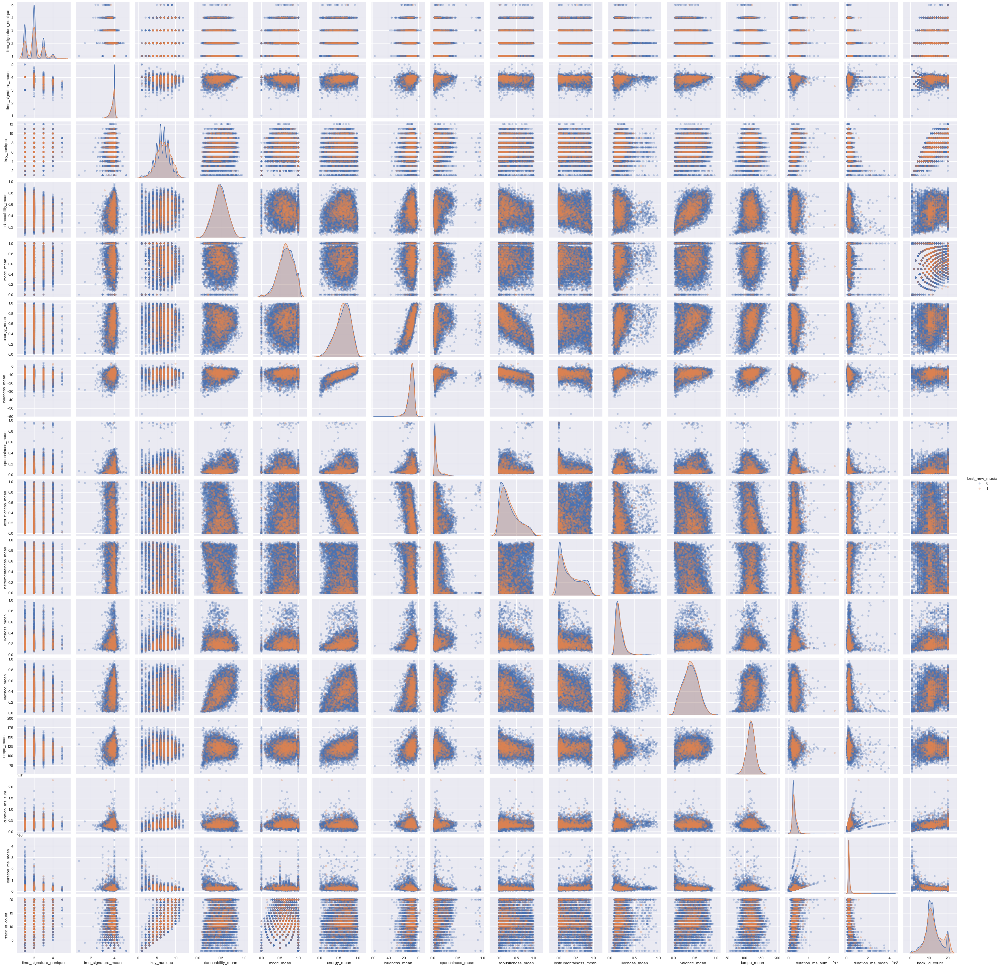

In [46]:
sample = df[['best_new_music', 'time_signature_nunique', 
                  'time_signature_mean', 
                  #'key_mode',
                  'key_nunique', 
                  'danceability_mean', 
                  #'danceability_std', 
                  'mode_mean',
                  #'mode_std', 
                  'energy_mean', 
                  #'energy_std', 
                  'loudness_mean',
                  #'loudness_std', 
                  'speechiness_mean', 
                  #'speechiness_std',
                  'acousticness_mean', 
                  #'acousticness_std', 
                  'instrumentalness_mean',
                  #'instrumentalness_std', 
                  'liveness_mean', 
                  #'liveness_std', 
                  'valence_mean',
                  #'valence_std', 
                  'tempo_mean', 
                  #'tempo_std', 
                  'duration_ms_sum',
                  'duration_ms_mean', 
                  #'duration_ms_std', 
                  'track_id_count']]

sns.pairplot(sample, hue='best_new_music', plot_kws=dict(alpha=.3, edgecolor='none'));

#### Feature testing - part 2

Now to add the standard deviation features in. 

In [47]:
X = df_bnm.loc[:,['scrobbles_lastfm',
                  'listeners_lastfm', 
                  'label_strength', 
                  'album_genre_Other', 
                  'album_genre_electronic',
                  'album_genre_experimental', 
                  'album_genre_folk/country',
                  'album_genre_global', 
                  'album_genre_jazz', 
                  'album_genre_metal',
                  'album_genre_pop/r&b', 
                  'album_genre_rap', 
                  'album_genre_rock',
                  'review_delay',
                  'time_signature_nunique', 
                  'time_signature_mean', 
                  'key_nunique', 
                  'danceability_mean', 
                  'danceability_std', 
                  'mode_mean',
                  'mode_std', 
                  'energy_mean', 
                  'energy_std', 
                  'loudness_mean',
                  'loudness_std', 
                  'speechiness_mean', 
                  'speechiness_std',
                  'acousticness_mean', 
                  'acousticness_std', 
                  'instrumentalness_mean',
                  'instrumentalness_std', 
                  'liveness_mean', 
                  'liveness_std', 
                  'valence_mean',
                  'valence_std', 
                  'tempo_mean', 
                  'tempo_std', 
                  'duration_ms_sum',
                  'duration_ms_mean', 
                  'duration_ms_std', 
                  'track_id_count']]

y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit6 = LogisticRegression()
logit6.fit(X_train, y_train)
logit6_preds = logit6.predict(X_val)

print('Baseline logistic regression classification metrics:\n')
accuracy = cross_val_score(logit6, X_train, y_train, cv=kf, scoring='accuracy')
precision = cross_val_score(logit6, X_train, y_train, cv=kf, scoring='precision')
recall = cross_val_score(logit6, X_train, y_train, cv=kf, scoring='recall')
f1 = cross_val_score(logit6, X_train, y_train, cv=kf, scoring='f1')
roc_auc = cross_val_score(logit6, X_train, y_train, cv=kf, scoring='roc_auc')

print('mean accuracy:', ' {:6.2f}%'.format(100 * np.mean(accuracy)))
print('mean precision:', '{:6.2f}%'.format(100 * np.mean(precision)))
print('mean recall:', '   {:6.2f}%'.format(100 * np.mean(recall)))
print('mean f1:', '       {:6.2f}%'.format(100 * np.mean(f1)))
print('mean ROC AUC:', '   {:6.3f}'.format(np.mean(roc_auc)))

logit6_conf_mat = confusion_matrix(y_true=y_val, y_pred=logit6_preds)
print('\nConfusion Matrix:\n',logit6_conf_mat)

Baseline logistic regression classification metrics:



/Users/max/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


mean accuracy:   93.67%
mean precision:  11.67%
mean recall:      0.42%
mean f1:          0.80%
mean ROC AUC:     0.537

Confusion Matrix:
 [[1727    2]
 [ 115    0]]


Slightly better F1. Not much but I'll take it for now. 

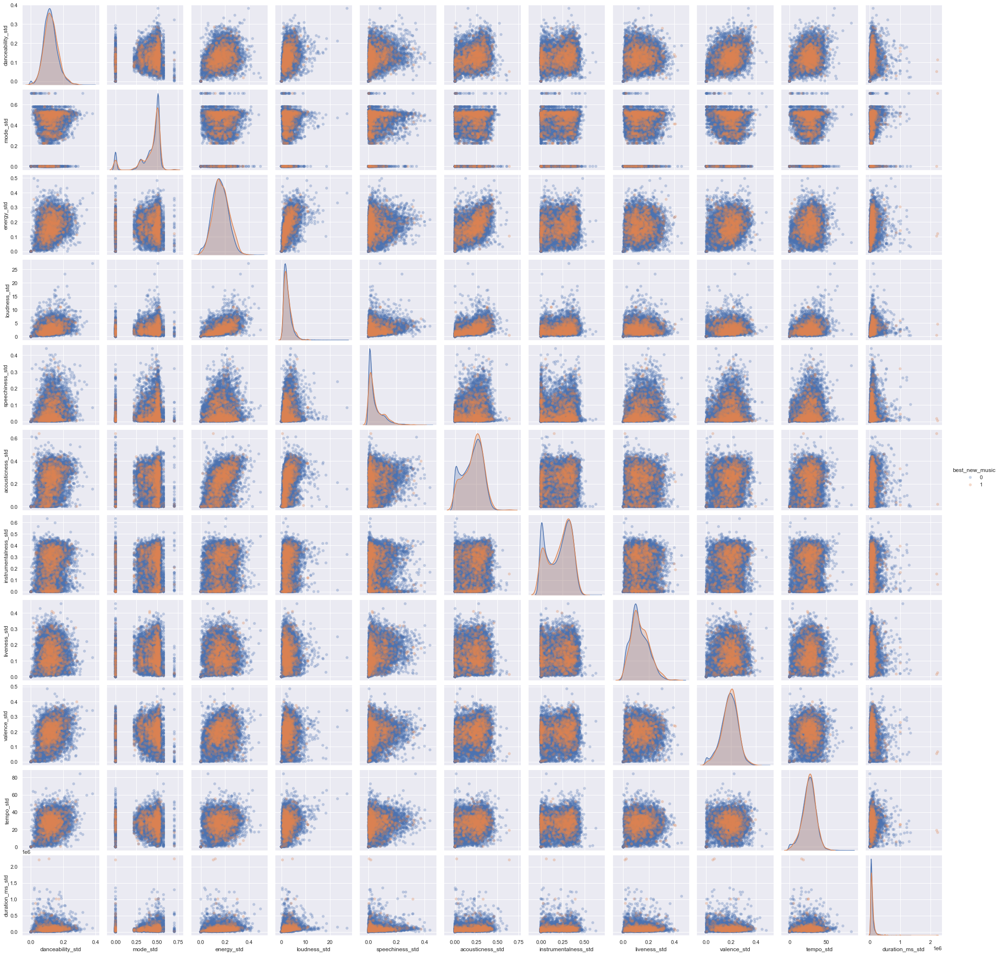

In [48]:
sample = df[['best_new_music', 
                  'danceability_std', 
                  'mode_std', 
                  'energy_std', 
                  'loudness_std', 
                  'speechiness_std',
                  'acousticness_std', 
                  'instrumentalness_std', 
                  'liveness_std', 
                  'valence_std', 
                  'tempo_std',
                'duration_ms_std']]

sns.pairplot(sample, hue='best_new_music', plot_kws=dict(alpha=.3, edgecolor='none'));

In [83]:
# setting all selected features to a list to shorten code for rest of notebook

features = ['scrobbles_lastfm',
                  'listeners_lastfm', 
                  'label_strength', 
                  'album_genre_Other', 
                  'album_genre_electronic',
                  'album_genre_experimental', 
                  'album_genre_folk/country',
                  'album_genre_global', 
                  'album_genre_jazz', 
                  'album_genre_metal',
                  'album_genre_pop/r&b', 
                  'album_genre_rap', 
                  'album_genre_rock',
                  'review_delay',
                  'time_signature_nunique', 
                  'time_signature_mean', 
                  'key_nunique', 
                  'danceability_mean', 
                  'danceability_std', 
                  'mode_mean',
                  'mode_std', 
                  'energy_mean', 
                  'energy_std', 
                  'loudness_mean',
                  'loudness_std', 
                  'speechiness_mean', 
                  'speechiness_std',
                  'acousticness_mean', 
                  'acousticness_std', 
                  'instrumentalness_mean',
                  'instrumentalness_std', 
                  'liveness_mean', 
                  'liveness_std', 
                  'valence_mean',
                  'valence_std', 
                  'tempo_mean', 
                  'tempo_std', 
                  'duration_ms_sum',
                  'duration_ms_mean', 
                  'duration_ms_std', 
                  'track_id_count']


## Class Imbalance Adjustments

The negative class has far more members than the positive class, so I will oversample the positive class to better train the model. Then I will compare the results to the baseline model we just did. 

In [50]:
df_bnm.best_new_music.value_counts()

0    10806
1      719
Name: best_new_music, dtype: int64

0    0.937614
1    0.062386
Name: best_new_music, dtype: float64


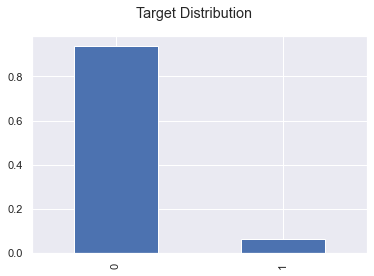

In [181]:
target_pcts = df_bnm.best_new_music.value_counts(normalize=True) 
print(target_pcts)

target_pcts.plot(kind='bar')
plt.suptitle('Target Distribution')
plt.savefig('viz/target_dist.svg');

### Oversampling

In [164]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit7 = LogisticRegression(solver='liblinear') 
logit7.fit(X_train, y_train)

print('Simple Logistic Regression;        Test F1: {:6.3f}, Test AUC: {:6.3f}'.format(
     f1_score(y_val, logit7.predict(X_val)), 
     roc_auc_score(y_val, logit7.predict_proba(X_val)[:,1])))

for i in range(2,16):
    # setup for the ratio argument of RandomOverSampler initialization
    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * i, 0 : n_neg} 

    # randomly oversample positive samples: create 4x as many 
    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 

    X_tr_rs, y_tr_rs = ROS.fit_sample(X_train, y_train)
    lr_os = LogisticRegression(solver='liblinear') 
    lr_os.fit(X_tr_rs, y_tr_rs)

    print('{}X Oversample Logistic Regression; Test F1: {:6.3f}, Test AUC: {:6.3f}'.format(i,
         f1_score(y_val, lr_os.predict(X_val)), 
         roc_auc_score(y_val, lr_os.predict_proba(X_val)[:,1])))

Simple Logistic Regression;        Test F1:  0.000, Test AUC:  0.536
2X Oversample Logistic Regression; Test F1:  0.047, Test AUC:  0.560
3X Oversample Logistic Regression; Test F1:  0.070, Test AUC:  0.572
4X Oversample Logistic Regression; Test F1:  0.088, Test AUC:  0.580
5X Oversample Logistic Regression; Test F1:  0.107, Test AUC:  0.589
6X Oversample Logistic Regression; Test F1:  0.128, Test AUC:  0.599
7X Oversample Logistic Regression; Test F1:  0.127, Test AUC:  0.609
8X Oversample Logistic Regression; Test F1:  0.159, Test AUC:  0.621
9X Oversample Logistic Regression; Test F1:  0.157, Test AUC:  0.632
10X Oversample Logistic Regression; Test F1:  0.176, Test AUC:  0.644
11X Oversample Logistic Regression; Test F1:  0.184, Test AUC:  0.651
12X Oversample Logistic Regression; Test F1:  0.182, Test AUC:  0.658
13X Oversample Logistic Regression; Test F1:  0.186, Test AUC:  0.665
14X Oversample Logistic Regression; Test F1:  0.184, Test AUC:  0.670
15X Oversample Logistic Regre

In [16]:
# fitting to resuts with best f1

X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

cv_logit8_accuracy, cv_logit8_precision, cv_logit8_recall, cv_logit8_f1, cv_logit8_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 
    
    # oversampling training data
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)
    
    #simple logistic regression
    logit8 = LogisticRegression(solver='liblinear') 
    logit8.fit(X_train_resampled, y_train_resampled)
    logit8_preds = logit8.predict(X_val)

    
    cv_logit8_accuracy.append(accuracy_score(y_val, logit8_preds))
    cv_logit8_precision.append(precision_score(y_val, logit8_preds))
    cv_logit8_recall.append(recall_score(y_val, logit8_preds))
    cv_logit8_f1.append(f1_score(y_val, logit8_preds))
    cv_logit8_roc_auc.append(roc_auc_score(y_val, logit8.predict_proba(X_val)[:,1]))   

#     cm = confusion_matrix(y_true=y_val, y_pred=logit8_preds)
#     cv_cm.append(cm)
#     print(f'\nConfusion Matrix:\n', cm)

print(f'Logistic regression w/ oversampling mean cv accuracy:  {100*np.mean(cv_logit8_accuracy):.2f}% +- {100*np.std(cv_logit8_accuracy):.2f}%')
print(f'Logistic regression w/ oversampling mean cv precision: {100*np.mean(cv_logit8_precision):.2f}% +- {100*np.std(cv_logit8_accuracy):.2f}%')
print(f'Logistic regression w/ oversampling mean cv recall:    {100*np.mean(cv_logit8_recall):.2f}% +- {100*np.std(cv_logit8_accuracy):.2f}%')
print(f'Logistic regression w/ oversampling mean cv f1:        {100*np.mean(cv_logit8_f1):.2f}% +- {100*np.std(cv_logit8_f1):.2f}%')
print(f'Logistic regression w/ oversampling mean cv ROC AUC:    {np.mean(cv_logit8_roc_auc):.3f} +- {np.std(cv_logit8_roc_auc):.2f}')



Logistic regression w/ oversampling mean cv accuracy:  77.01% +- 1.86%
Logistic regression w/ oversampling mean cv precision: 12.60% +- 1.86%
Logistic regression w/ oversampling mean cv recall:    44.57% +- 1.86%
Logistic regression w/ oversampling mean cv f1:        19.52% +- 3.29%
Logistic regression w/ oversampling mean cv ROC AUC:    0.683 +- 0.04


### Changing decision threshold

#### One data without oversampling - Testing to find best threshold

/Users/max/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression Model best F1 score 0.140 at prob decision threshold >= 0.111


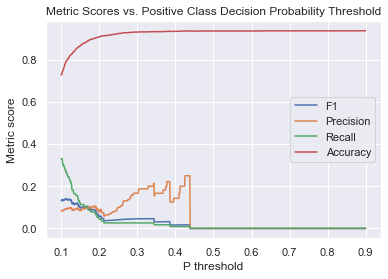

In [219]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

logit9 = LogisticRegression()
logit9.fit(X_train, y_train)

thresh_ps = np.linspace(.10,.90,1000)
model_val_probs = logit9.predict_proba(X_val)[:,1] # positive class probs, same basic logistic model we fit in section 2 

f1_scores, prec_scores, rec_scores, acc_scores = [], [], [], []
for p in thresh_ps:
    model_val_labels = model_val_probs >= p
    f1_scores.append(f1_score(y_val, model_val_labels))    
    prec_scores.append(precision_score(y_val, model_val_labels))
    rec_scores.append(recall_score(y_val, model_val_labels))
    acc_scores.append(accuracy_score(y_val, model_val_labels))
    
plt.plot(thresh_ps, f1_scores)
plt.plot(thresh_ps, prec_scores)
plt.plot(thresh_ps, rec_scores)
plt.plot(thresh_ps, acc_scores)

plt.title('Metric Scores vs. Positive Class Decision Probability Threshold')
plt.legend(['F1','Precision','Recall','Accuracy'])
plt.xlabel('P threshold')
plt.ylabel('Metric score')

best_f1_score = np.max(f1_scores) 
best_thresh_p = thresh_ps[np.argmax(f1_scores)]

print('Logistic Regression Model best F1 score %.3f at prob decision threshold >= %.3f' 
      % (best_f1_score, best_thresh_p))

#### One data without oversampling - Applying best threshold

In [141]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)


cv_logit9_accuracy, cv_logit9_precision, cv_logit9_recall, cv_logit9_f1, cv_logit9_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 
    
    #simple logistic regression
    logit9 = LogisticRegression(solver='liblinear') 
    logit9.fit(X_train, y_train)
    
    # applying decision threshold
    threshold = 0.121221 # best result from testing
    yhat = (logit9.predict_proba(X_val) >= threshold).astype(int)
    logit9_preds = yhat[:,1]
    
    cv_logit9_accuracy.append(accuracy_score(y_val, logit9_preds))
    cv_logit9_precision.append(precision_score(y_val, logit9_preds))
    cv_logit9_recall.append(recall_score(y_val, logit9_preds))
    cv_logit9_f1.append(f1_score(y_val, logit9_preds))
    cv_logit9_roc_auc.append(roc_auc_score(y_val, logit9.predict_proba(X_val)[:,1]))   

    cm = confusion_matrix(y_true=y_val, y_pred=logit8_preds)
    cv_cm.append(cm)
    print(f'\nConfusion Matrix:\n', cm)
    
print('\nSummary statistics for adjusted decision threshold with NO oversampling:\n')
print(f'Logistic regression mean cv accuracy:  {100*np.mean(cv_logit9_accuracy):.2f}% +- {100*np.std(cv_logit9_accuracy):.2f}%')
print(f'Logistic regression mean cv precision: {100*np.mean(cv_logit9_precision):.2f}% +- {100*np.std(cv_logit9_accuracy):.2f}%')
print(f'Logistic regression mean cv recall:    {100*np.mean(cv_logit9_recall):.2f}% +- {100*np.std(cv_logit9_accuracy):.2f}%')
print(f'Logistic regression mean cv f1:        {100*np.mean(cv_logit9_f1):.2f}% +- {100*np.std(cv_logit9_f1):.2f}%')
print(f'Logistic regression mean cv ROC AUC:    {np.mean(cv_logit9_roc_auc):.3f} +- {np.std(cv_logit9_roc_auc):.2f}')



Confusion Matrix:
 [[1290  436]
 [  86   32]]

Confusion Matrix:
 [[1280  447]
 [  96   21]]

Confusion Matrix:
 [[1273  437]
 [ 103   31]]

Confusion Matrix:
 [[1282  446]
 [  94   22]]

Confusion Matrix:
 [[1330  424]
 [  46   44]]

Summary statistics for adjusted decision threshold with NO oversampling:

Logistic regression mean cv accuracy:  80.59% +- 0.94%
Logistic regression mean cv precision: 8.75% +- 0.94%
Logistic regression mean cv recall:    22.33% +- 0.94%
Logistic regression mean cv f1:        12.48% +- 2.31%
Logistic regression mean cv ROC AUC:    0.542 +- 0.03


#### On oversampled data - Testing to find best threshold

Oversampling ratio Counter({0: 6916, 1: 5980})
Logistic Regression Model best F1 score 0.196 at prob decision threshold >= 0.507608


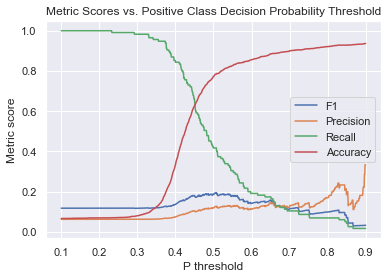

In [217]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

# oversampling
multiplier = 13

n_pos = np.sum(y_train == 1)
n_neg = np.sum(y_train == 0)
ratio = {1 : n_pos * multiplier, 0 : n_neg} 

ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 

X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)
print('Oversampling ratio', Counter(y_train_resampled))

# fitting model
logit10 = LogisticRegression()
logit10.fit(X_train_resampled, y_train_resampled)

thresh_ps = np.linspace(.10,.90,1000)
model_val_probs = logit10.predict_proba(X_val)[:,1] # positive class probs, same basic logistic model we fit in section 2 

# TESTING
f1_scores, prec_scores, rec_scores, acc_scores = [], [], [], []
for p in thresh_ps:
    model_val_labels = model_val_probs >= p
    f1_scores.append(f1_score(y_val, model_val_labels))    
    prec_scores.append(precision_score(y_val, model_val_labels))
    rec_scores.append(recall_score(y_val, model_val_labels))
    acc_scores.append(accuracy_score(y_val, model_val_labels))
    
plt.plot(thresh_ps, f1_scores)
plt.plot(thresh_ps, prec_scores)
plt.plot(thresh_ps, rec_scores)
plt.plot(thresh_ps, acc_scores)

plt.title('Metric Scores vs. Positive Class Decision Probability Threshold')
plt.legend(['F1','Precision','Recall','Accuracy'])
plt.xlabel('P threshold')
plt.ylabel('Metric score')

best_f1_score = np.max(f1_scores) 
best_thresh_p = thresh_ps[np.argmax(f1_scores)]

print('Logistic Regression Model best F1 score %.3f at prob decision threshold >= %.6f' 
      % (best_f1_score, best_thresh_p))



#### On oversampled data - Applying best threshold

In [221]:
# fitting to resuts with best f1

X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

cv_logit10_accuracy, cv_logit10_precision, cv_logit10_recall, cv_logit10_f1, cv_logit10_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

    # oversampling
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

    # fitting model
    logit10 = LogisticRegression() 
    logit10.fit(X_train_resampled, y_train_resampled)

    # applying the new decision threshold to predictions
    threshold = 0.486787
    yhat = (logit10.predict_proba(X_val) >= threshold).astype(int)
    logit10_preds = yhat[:,1]
    
    cv_logit10_accuracy.append(accuracy_score(y_val, logit10_preds))
    cv_logit10_precision.append(precision_score(y_val, logit10_preds))
    cv_logit10_recall.append(recall_score(y_val, logit10_preds))
    cv_logit10_f1.append(f1_score(y_val, logit10_preds))
    cv_logit10_roc_auc.append(roc_auc_score(y_val, logit10_preds))   

    cm = confusion_matrix(y_true=y_val, y_pred=logit10_preds)
    cv_cm.append(cm)
    print(f'\nConfusion Matrix:\n', cm)
    
print('\nSummary statistics for adjusted decision threshold WITH oversampling:\n')
print(f'Logistic regression mean cv accuracy:  {100*np.mean(cv_logit10_accuracy):.2f}% +- {100*np.std(cv_logit10_accuracy):.2f}%')
print(f'Logistic regression mean cv precision: {100*np.mean(cv_logit10_precision):.2f}% +- {100*np.std(cv_logit10_accuracy):.2f}%')
print(f'Logistic regression mean cv recall:    {100*np.mean(cv_logit10_recall):.2f}% +- {100*np.std(cv_logit10_accuracy):.2f}%')
print(f'Logistic regression mean cv f1:        {100*np.mean(cv_logit10_f1):.2f}% +- {100*np.std(cv_logit10_f1):.2f}%')
print(f'Logistic regression mean cv ROC AUC:    {np.mean(cv_logit10_roc_auc):.3f} +- {np.std(cv_logit10_roc_auc):.2f}')


Confusion Matrix:
 [[1309  417]
 [  69   49]]

Confusion Matrix:
 [[1346  381]
 [  48   69]]

Confusion Matrix:
 [[1338  372]
 [  69   65]]

Confusion Matrix:
 [[1319  409]
 [  59   57]]

Confusion Matrix:
 [[1250  504]
 [  41   49]]

Summary statistics for adjusted decision threshold WITH oversampling:

Logistic regression mean cv accuracy:  74.31% +- 2.21%
Logistic regression mean cv precision: 12.36% +- 2.21%
Logistic regression mean cv recall:    50.52% +- 2.21%
Logistic regression mean cv f1:        19.74% +- 3.44%
Logistic regression mean cv ROC AUC:    0.632 +- 0.03


#### Decision threshold conclusion: 
Best results were achieved by oversampling the minority class 13x and by slightly adjusting the decision threshold. We will use these are our paramers moving forward. 

## Testing model types

In [24]:
# model types that will be tested

lr1 = LogisticRegression(solver='liblinear')
knn1 = KNeighborsClassifier()
gnb1 = GaussianNB()
dt1 = DecisionTreeClassifier()
rf1 = RandomForestClassifier()
gbm1 = xgb.XGBClassifier()
svm1 = SVC(probability=True)

model_list = [lr1, knn1, svm1, gnb1, dt1, rf1, gbm1]

In [159]:
# splitting data

X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

In [160]:
# testing each model type 
for model in model_list:
    cv_accuracy, cv_precision, cv_recall, cv_f1, cv_roc_auc = [], [], [], [], [] #collect the validation results 
    cv_cm = []
    
    # putting each model through a CV loop
    for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
        # splitting data
        X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
        X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

        # oversampling
        multiplier = 13

        n_pos = np.sum(y_train == 1)
        n_neg = np.sum(y_train == 0)
        ratio = {1 : n_pos * multiplier, 0 : n_neg} 

        ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
        X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

        # fitting model
        model.fit(X_train_resampled, y_train_resampled)

        # applying the new decision threshold to predictions
        threshold = 0.486787
        preds = (model.predict(X_val) >= threshold).astype(int)

        # calculating metrics for each fold of cv
        cv_accuracy.append(accuracy_score(y_val, preds))
        cv_precision.append(precision_score(y_val, preds))
        cv_recall.append(recall_score(y_val, preds))
        cv_f1.append(f1_score(y_val, preds))
        cv_roc_auc.append(roc_auc_score(y_val, preds))   

#         cm = confusion_matrix(y_true=y_val, y_pred=preds)
#         cv_cm.append(cm)
#         print(f'\nConfusion Matrix:\n', cm)

    # printing cv mean metrics 
    print('\nSummary statistics for adjusted decision threshold WITH oversampling:\n')
    print(f'{model} mean cv accuracy:  {100*np.mean(cv_accuracy):.2f}% +- {100*np.std(cv_accuracy):.2f}%')
    print(f'{model} mean cv precision: {100*np.mean(cv_precision):.2f}% +- {100*np.std(cv_accuracy):.2f}%')
    print(f'{model} mean cv recall:    {100*np.mean(cv_recall):.2f}% +- {100*np.std(cv_accuracy):.2f}%')
    print(f'{model} mean cv f1:        {100*np.mean(cv_f1):.2f}% +- {100*np.std(cv_f1):.2f}%')
    print(f'{model} mean cv ROC AUC:    {np.mean(cv_roc_auc):.3f} +- {np.std(cv_roc_auc):.2f}')


Summary statistics for adjusted decision threshold WITH oversampling:

LogisticRegression(solver='liblinear') mean cv accuracy:  77.01% +- 1.86%
LogisticRegression(solver='liblinear') mean cv precision: 12.60% +- 1.86%
LogisticRegression(solver='liblinear') mean cv recall:    44.57% +- 1.86%
LogisticRegression(solver='liblinear') mean cv f1:        19.52% +- 3.29%
LogisticRegression(solver='liblinear') mean cv ROC AUC:    0.619 +- 0.03

Summary statistics for adjusted decision threshold WITH oversampling:

KNeighborsClassifier() mean cv accuracy:  82.05% +- 0.51%
KNeighborsClassifier() mean cv precision: 14.50% +- 0.51%
KNeighborsClassifier() mean cv recall:    38.41% +- 0.51%
KNeighborsClassifier() mean cv f1:        20.92% +- 1.98%
KNeighborsClassifier() mean cv ROC AUC:    0.617 +- 0.02

Summary statistics for adjusted decision threshold WITH oversampling:

SVC(probability=True) mean cv accuracy:  72.17% +- 0.98%
SVC(probability=True) mean cv precision: 14.00% +- 0.98%
SVC(probabil

#### Model Testing Conclusion
Gradient boosting achieved the best results so we will select that as our model. Next I will try to refine the hyperparameters to see if we can get F1 to go up a little more. 

### Tuning GBM Hyperparameters

In [130]:
# using CV loop to determine optimal n_estimators

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

    # oversampling
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)
    
    gbm = xgb.XGBClassifier( # arbitrarily setting some baseline hyperparameters
                       n_estimators=30000, #arbitrary large number
                       max_depth=3,
                       objective="binary:logistic",
                       learning_rate=.1, 
                       subsample=1,
                       min_child_weight=1,
                       colsample_bytree=.8)

    eval_set=[(X_train_resampled, y_train_resampled),(X_val,y_val)] #tracking train/validation error as we go

    fit_model = gbm.fit( 
                        X_train_resampled, y_train_resampled, 
                        eval_set=eval_set,
                        eval_metric='auc',
                        early_stopping_rounds=20,
                        verbose=True #gives output log as below
                       )


[0]	validation_0-auc:0.84665	validation_1-auc:0.79712
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 20 rounds.
[1]	validation_0-auc:0.86546	validation_1-auc:0.79140
[2]	validation_0-auc:0.86455	validation_1-auc:0.77988
[3]	validation_0-auc:0.87043	validation_1-auc:0.79920
[4]	validation_0-auc:0.87108	validation_1-auc:0.78956
[5]	validation_0-auc:0.87584	validation_1-auc:0.80131
[6]	validation_0-auc:0.87952	validation_1-auc:0.79958
[7]	validation_0-auc:0.88443	validation_1-auc:0.80622
[8]	validation_0-auc:0.89036	validation_1-auc:0.81355
[9]	validation_0-auc:0.89253	validation_1-auc:0.81800
[10]	validation_0-auc:0.89483	validation_1-auc:0.82325
[11]	validation_0-auc:0.89494	validation_1-auc:0.82567
[12]	validation_0-auc:0.89575	validation_1-auc:0.82662
[13]	validation_0-auc:0.89604	validation_1-auc:0.82720
[14]	validation_0-auc:0.89620	validation_1-auc:0.82771
[15]	validation_0-auc:0.8965

In [84]:
n_iterations = [119,106,72,45,45]
mean_iterations = round(np.mean(n_iterations))
mean_iterations

77

In [117]:
# fitting to mean iterations

X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

    # oversampling
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

    # fitting model
    gbm = xgb.XGBClassifier(
                        n_estimators=mean_iterations, # set from best test result
                       max_depth=3,
                       objective="binary:logistic",
                       learning_rate=.1, 
                       subsample=1,
                       min_child_weight=1,
                       colsample_bytree=.8
                      )

    #eval_set=[(X_train_resampled, y_train_resampled),(X_val,y_val)] #tracking train/validation error as we go

    gbm.fit(X_train_resampled, y_train_resampled)

    # applying the new decision threshold to predictions 0.486787
    threshold = 0.48
    gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]

    cv_gbm_accuracy.append(accuracy_score(y_val, gbm_preds))
    cv_gbm_precision.append(precision_score(y_val, gbm_preds))
    cv_gbm_recall.append(recall_score(y_val, gbm_preds))
    cv_gbm_f1.append(f1_score(y_val, gbm_preds))
    cv_gbm_roc_auc.append(roc_auc_score(y_val, gbm_preds))   

    cm = confusion_matrix(y_true=y_val, y_pred=gbm_preds)
    cv_cm.append(cm)
    print(f'\nConfusion Matrix:\n', cm)
    
print('\nSummary statistics for adjusted decision threshold WITH oversampling:\n')
print(f'Mean cv accuracy:  {100*np.mean(cv_gbm_accuracy):.2f}% +- {100*np.std(cv_gbm_accuracy):.2f}%')
print(f'Mean cv precision: {100*np.mean(cv_gbm_precision):.2f}% +- {100*np.std(cv_gbm_precision):.2f}%')
print(f'Mean cv recall:    {100*np.mean(cv_gbm_recall):.2f}% +- {100*np.std(cv_gbm_recall):.2f}%')
print(f'Mean cv f1:        {100*np.mean(cv_gbm_f1):.2f}% +- {100*np.std(cv_gbm_f1):.2f}%')
print(f'Mean cv ROC AUC:    {np.mean(cv_gbm_roc_auc):.3f} +- {np.std(cv_gbm_roc_auc):.2f}')


Confusion Matrix:
 [[1285  441]
 [  27   91]]

Confusion Matrix:
 [[1296  431]
 [  17  100]]

Confusion Matrix:
 [[1264  446]
 [  20  114]]

Confusion Matrix:
 [[1262  466]
 [  13  103]]

Confusion Matrix:
 [[1264  490]
 [  11   79]]

Summary statistics for adjusted decision threshold WITH oversampling:

Mean cv accuracy:  74.38% +- 0.94%
Mean cv precision: 17.66% +- 2.16%
Mean cv recall:    84.85% +- 4.11%
Mean cv f1:        29.15% +- 3.02%
Mean cv ROC AUC:    0.793 +- 0.02


#### Retesting Decision Threshold with GBM

Oversampling ratio Counter({0: 6916, 1: 5980})
Logistic Regression Model best F1 score 0.329 at prob decision threshold >= 0.673737


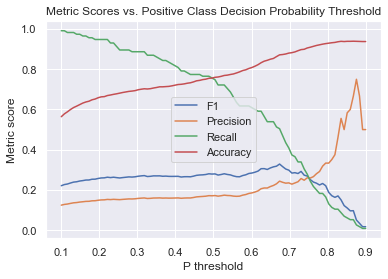

In [118]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)
X_train, X_val, y_train, y_val = train_test_split(X_tr_val, y_tr_val, test_size=0.2, random_state=17, stratify=y_tr_val)

# oversampling
multiplier = 13

n_pos = np.sum(y_train == 1)
n_neg = np.sum(y_train == 0)
ratio = {1 : n_pos * multiplier, 0 : n_neg} 

ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 

X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)
print('Oversampling ratio', Counter(y_train_resampled))

# fitting model

gbm = xgb.XGBClassifier(
                        n_estimators=mean_iterations, # set from best test result
                       max_depth=3,
                       objective="binary:logistic",
                       learning_rate=.1, 
                       subsample=1,
                       min_child_weight=1,
                       colsample_bytree=.8
                      )

gbm.fit(X_train_resampled, y_train_resampled)

thresh_ps = np.linspace(.10,.90,100)
model_val_probs = (gbm.predict_proba(X_val))[:,1]

# TESTING
f1_scores, prec_scores, rec_scores, acc_scores = [], [], [], []
for p in thresh_ps:
    model_val_labels = model_val_probs >= p
    f1_scores.append(f1_score(y_val, model_val_labels))    
    prec_scores.append(precision_score(y_val, model_val_labels))
    rec_scores.append(recall_score(y_val, model_val_labels))
    acc_scores.append(accuracy_score(y_val, model_val_labels))
    
plt.plot(thresh_ps, f1_scores)
plt.plot(thresh_ps, prec_scores)
plt.plot(thresh_ps, rec_scores)
plt.plot(thresh_ps, acc_scores)

plt.title('Metric Scores vs. Positive Class Decision Probability Threshold')
plt.legend(['F1','Precision','Recall','Accuracy'])
plt.xlabel('P threshold')
plt.ylabel('Metric score')

best_f1_score = np.max(f1_scores) 
best_thresh_p = thresh_ps[np.argmax(f1_scores)]

print('Logistic Regression Model best F1 score %.3f at prob decision threshold >= %.6f' 
      % (best_f1_score, best_thresh_p))

#### Applying new decision threshold (again)
This model benefits from a much *higher* decision threshold than logistic regression, so I will adjust it accordingly. 

In [19]:
# fitting to resuts with best f1

X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

    # oversampling
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

    # fitting model
    gbm = xgb.XGBClassifier(
                        n_estimators=mean_iterations, # set from best test result
                       max_depth=3,
                       objective="binary:logistic",
                       learning_rate=.1, 
                       subsample=1,
                       min_child_weight=1,
                       colsample_bytree=.8
                        )
    gbm.fit(X_train_resampled, y_train_resampled)

    # applying the new decision threshold to predictions 0.486787
    threshold = 0.673737
    gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]
    
    cv_gbm_accuracy.append(accuracy_score(y_val, gbm_preds))
    cv_gbm_precision.append(precision_score(y_val, gbm_preds))
    cv_gbm_recall.append(recall_score(y_val, gbm_preds))
    cv_gbm_f1.append(f1_score(y_val, gbm_preds))
    cv_gbm_roc_auc.append(roc_auc_score(y_val, gbm_preds))   

    cm = confusion_matrix(y_true=y_val, y_pred=gbm_preds)
    cv_cm.append(cm)
    print(f'\nConfusion Matrix:\n', cm)
    
print('\nSummary statistics for adjusted decision threshold WITH oversampling:\n')
print(f'Logistic regression mean cv accuracy:  {100*np.mean(cv_gbm_accuracy):.2f}% +- {100*np.std(cv_gbm_accuracy):.2f}%')
print(f'Logistic regression mean cv precision: {100*np.mean(cv_gbm_precision):.2f}% +- {100*np.std(cv_gbm_precision):.2f}%')
print(f'Logistic regression mean cv recall:    {100*np.mean(cv_gbm_recall):.2f}% +- {100*np.std(cv_gbm_recall):.2f}%')
print(f'Logistic regression mean cv f1:        {100*np.mean(cv_gbm_f1):.2f}% +- {100*np.std(cv_gbm_f1):.2f}%')
print(f'Logistic regression mean cv ROC AUC:    {np.mean(cv_gbm_roc_auc):.3f} +- {np.std(cv_gbm_roc_auc):.2f}')


Confusion Matrix:
 [[1544  182]
 [  71   47]]

Confusion Matrix:
 [[1568  159]
 [  52   65]]

Confusion Matrix:
 [[1539  171]
 [  62   72]]

Confusion Matrix:
 [[1500  228]
 [  47   69]]

Confusion Matrix:
 [[1521  233]
 [  37   53]]

Summary statistics for adjusted decision threshold WITH oversampling:

Logistic regression mean cv accuracy:  86.53% +- 1.29%
Logistic regression mean cv precision: 24.19% +- 4.46%
Logistic regression mean cv recall:    53.50% +- 7.15%
Logistic regression mean cv f1:        33.00% +- 4.72%
Logistic regression mean cv ROC AUC:    0.711 +- 0.03


#### Regularization: L1 

In [120]:
alpha_f1 = {}

for i in np.linspace(1,1000):
    # fitting to resuts with best f1

    X = df_bnm.loc[:,features]
    y = df_bnm.best_new_music

    X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
    X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

    cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
    cv_cm = []

    for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
        # splitting data
        X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
        X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

        # oversampling
        multiplier = 13

        n_pos = np.sum(y_train == 1)
        n_neg = np.sum(y_train == 0)
        ratio = {1 : n_pos * multiplier, 0 : n_neg} 

        ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
        X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

        # fitting model
        gbm = xgb.XGBClassifier(
                            n_estimators=mean_iterations, # set from best test result
                           max_depth=3,
                           objective="binary:logistic",
                           learning_rate=.2, 
                           subsample=1,
                           min_child_weight=1,
                           colsample_bytree=.8,
                         alpha=i # testing for best alpha
                            )
        gbm.fit(X_train_resampled, y_train_resampled)

        # applying the new decision threshold to predictions 0.486787
        threshold = 0.673737
        gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]
        
        #dict of alpha values and f1 scores
        alpha_f1[i]=(f1_score(y_val, gbm_preds))


In [121]:
max_key = max(alpha_f1, key=alpha_f1.get)
alpha_f1[max_key]

0.2800982800982801

#### Regularization: L2

In [122]:
lambda_f1 = {}

for i in np.linspace(1,1000):
    # fitting to resuts with best f1

    X = df_bnm.loc[:,features]
    y = df_bnm.best_new_music

    X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
    X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

    cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
    cv_cm = []

    for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
        # splitting data
        X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
        X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

        # oversampling
        multiplier = 13

        n_pos = np.sum(y_train == 1)
        n_neg = np.sum(y_train == 0)
        ratio = {1 : n_pos * multiplier, 0 : n_neg} 

        ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
        X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

        # fitting model
        gbm = xgb.XGBClassifier(
                            n_estimators=mean_iterations, # set from best test result
                           max_depth=3,
                           objective="binary:logistic",
                           learning_rate=.2, 
                           subsample=1,
                           min_child_weight=1,
                           colsample_bytree=.8,
                         reg_lambda=i # testing for best alpha
                            )
        gbm.fit(X_train_resampled, y_train_resampled)

        # applying the new decision threshold to predictions 0.486787
        threshold = 0.673737
        gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]
        
        # dict of scores and alpha values
        lambda_f1[i]=(f1_score(y_val, gbm_preds))


In [123]:
max_key = max(lambda_f1, key=lambda_f1.get)
lambda_f1[max_key]

0.28780487804878047

#### Regularization: Gamma

In [124]:
gamma_f1 = {}

for i in np.linspace(1,1000):
    # fitting to resuts with best f1

    X = df_bnm.loc[:,features]
    y = df_bnm.best_new_music

    X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
    X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

    cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
    cv_cm = []

    for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
        # splitting data
        X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
        X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

        # oversampling
        multiplier = 13

        n_pos = np.sum(y_train == 1)
        n_neg = np.sum(y_train == 0)
        ratio = {1 : n_pos * multiplier, 0 : n_neg} 

        ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
        X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

        # fitting model
        gbm = xgb.XGBClassifier(
                            n_estimators=mean_iterations, # set from best test result
                           max_depth=3,
                           objective="binary:logistic",
                           learning_rate=.2, 
                           subsample=1,
                           min_child_weight=1,
                           colsample_bytree=.8,
                         gamma=i # testing for best alpha
                            )
        gbm.fit(X_train_resampled, y_train_resampled)

        # applying the new decision threshold to predictions 0.486787
        threshold = 0.673737
        gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]
        
        # dict of scores and alpha values
        gamma_f1[i]=(f1_score(y_val, gbm_preds))


In [125]:
max_key = max(gamma_f1, key=gamma_f1.get)
gamma_f1[max_key]

0.27602905569007263

#### Regularization: Summary

No regularization made an improvement on f1 score. 

#### Adjusting additional hypterparameters

In [138]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music

X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

cv_gbm_accuracy, cv_gbm_precision, cv_gbm_recall, cv_gbm_f1, cv_gbm_roc_auc = [], [], [], [], [] #collect the validation results 
cv_cm = []

for train_ind, val_ind in kf.split(X_tr_val, y_tr_val):
    # splitting data
    X_train, y_train = X_tr_val[train_ind], y_tr_val[train_ind]
    X_val, y_val = X_tr_val[val_ind], y_tr_val[val_ind] 

    # oversampling
    multiplier = 13

    n_pos = np.sum(y_train == 1)
    n_neg = np.sum(y_train == 0)
    ratio = {1 : n_pos * multiplier, 0 : n_neg} 

    ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
    X_train_resampled, y_train_resampled = ROS.fit_sample(X_train, y_train)

    # fitting model
    gbm = xgb.XGBClassifier(
                        n_estimators=3000, # set from best test result
                           max_depth=5,
                           objective="binary:logistic",
                           learning_rate=.046, 
                           subsample=1,
                           min_child_weight=1,
                           colsample_bytree=.8,
                        )
    
    eval_set=[(X_train_resampled, y_train_resampled),(X_val,y_val)] #tracking train/validation error as we go

    gbm.fit(X_train_resampled, y_train_resampled,
            eval_set=eval_set,
            eval_metric='auc',
            early_stopping_rounds=40,
            verbose=False)

    # applying the new decision threshold to predictions 0.486787
    threshold = 0.673737
    gbm_preds = (gbm.predict_proba(X_val) >= threshold).astype(int)[:,1]
    
    cv_gbm_accuracy.append(accuracy_score(y_val, gbm_preds))
    cv_gbm_precision.append(precision_score(y_val, gbm_preds))
    cv_gbm_recall.append(recall_score(y_val, gbm_preds))
    cv_gbm_f1.append(f1_score(y_val, gbm_preds))
    cv_gbm_roc_auc.append(roc_auc_score(y_val, gbm_preds))   

    cm = confusion_matrix(y_true=y_val, y_pred=gbm_preds)
    cv_cm.append(cm)
    print(f'\nConfusion Matrix:\n', cm)
    
print('\nSummary statistics for adjusted decision threshold WITH oversampling:\n')
print(f'Logistic regression mean cv accuracy:  {100*np.mean(cv_gbm_accuracy):.2f}% +- {100*np.std(cv_gbm_accuracy):.2f}%')
print(f'Logistic regression mean cv precision: {100*np.mean(cv_gbm_precision):.2f}% +- {100*np.std(cv_gbm_precision):.2f}%')
print(f'Logistic regression mean cv recall:    {100*np.mean(cv_gbm_recall):.2f}% +- {100*np.std(cv_gbm_recall):.2f}%')
print(f'Logistic regression mean cv f1:        {100*np.mean(cv_gbm_f1):.2f}% +- {100*np.std(cv_gbm_f1):.2f}%')
print(f'Logistic regression mean cv ROC AUC:    {np.mean(cv_gbm_roc_auc):.3f} +- {np.std(cv_gbm_roc_auc):.2f}')


Confusion Matrix:
 [[1613  113]
 [  82   36]]

Confusion Matrix:
 [[1593  134]
 [  58   59]]

Confusion Matrix:
 [[1583  127]
 [  69   65]]

Confusion Matrix:
 [[1538  190]
 [  52   64]]

Confusion Matrix:
 [[1591  163]
 [  48   42]]

Summary statistics for adjusted decision threshold WITH oversampling:

Logistic regression mean cv accuracy:  88.76% +- 1.01%
Logistic regression mean cv precision: 26.85% +- 4.76%
Logistic regression mean cv recall:    46.26% +- 8.37%
Logistic regression mean cv f1:        33.60% +- 5.11%
Logistic regression mean cv ROC AUC:    0.689 +- 0.04


## Scoring final model

In [89]:
X = df_bnm.loc[:,features]
y = df_bnm.best_new_music
X_tr_val, X_holdout, y_tr_val, y_holdout = train_test_split(X, y, test_size=0.2, random_state=17, stratify=y)
X_tr_val, y_tr_val = np.array(X_tr_val), np.array(y_tr_val)

# oversampling
multiplier = 13

n_pos = np.sum(y_tr_val == 1)
n_neg = np.sum(y_tr_val == 0)
ratio = {1 : n_pos * multiplier, 0 : n_neg} 

ROS = RandomOverSampler(sampling_strategy = ratio, random_state=17) 
X_train_resampled, y_train_resampled = ROS.fit_sample(X_tr_val, y_tr_val)

gbm_final = xgb.XGBClassifier(
                    n_estimators=3000, # arbitrarily high 
                       max_depth=5,
                       objective="binary:logistic",
                       learning_rate=.046, 
                       subsample=1,
                       min_child_weight=1,
                       colsample_bytree=.8,
                    )

eval_set=[(X_train_resampled, y_train_resampled),(X_holdout.values,y_holdout.values)] #tracking train/validation error as we go

gbm_final.fit(X_train_resampled, y_train_resampled,
        eval_set=eval_set,
        eval_metric='auc',
        early_stopping_rounds=40,
        verbose=False)

# applying the new decision threshold to predictions 
threshold = 0.673737
gbm_final_preds = (gbm_final.predict_proba(X_holdout.values, ntree_limit=gbm_final.best_ntree_limit) >= threshold).astype(int)[:,1]

# performance stats
final_accuracy = accuracy_score(y_holdout, gbm_final_preds)
final_precision = precision_score(y_holdout, gbm_final_preds)
final_recall = recall_score(y_holdout, gbm_final_preds)
final_f1 = f1_score(y_holdout, gbm_final_preds)
final_roc_auc = roc_auc_score(y_holdout, gbm_final_preds)

# confusion matrix
final_cm = confusion_matrix(y_true=y_holdout, y_pred=gbm_final_preds)
print(f'\nConfusion Matrix:\n', final_cm)
print('accuracy:  ', final_accuracy)
print('precision: ', final_precision)
print('recall:    ', final_recall)
print('f1:        ', final_f1)
print('ROC AOC:   ', final_roc_auc)



Confusion Matrix:
 [[1954  207]
 [  54   90]]
accuracy:   0.8867678958785249
precision:  0.30303030303030304
recall:     0.625
f1:         0.40816326530612246
ROC AOC:    0.7646055067098566


### Conclusion

Predicting whether or not an album will make BNM is a difficult problem to solve. Adding in album review score would have made it much easier to predict BNM, since there is strong correlation between higher scores and BNM class, but that would have made the model circular in that score and BNM are more or less two sides of the same coin. 

The bottom line is that these reviews are farily subjective and hard to predict. My final model ended up predicting a lot of false posities, which lead to poor precision score. Recall was a bit better, but in the end the model was still predicting about the same amount of false negatives as true positives (aka it was misclassification albums that actually got BNM and predicting that they would not. 

## Visualizing results

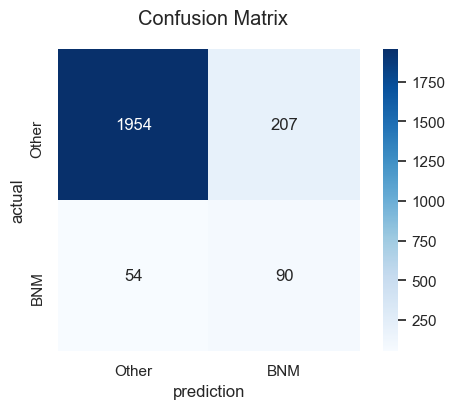

In [65]:
plt.figure(dpi=100)
sns.heatmap(final_cm, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['Other', 'BNM'],
           yticklabels=['Other', 'BNM']);
plt.xlabel('prediction')
plt.ylabel('actual')
plt.suptitle('Confusion Matrix')
plt.savefig('viz/confusion_matrix.svg');

''

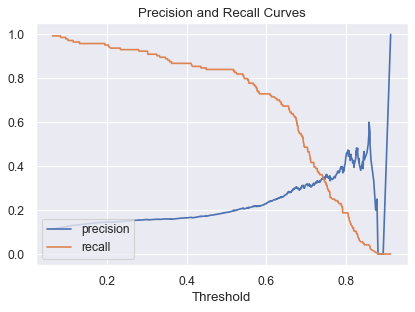

In [90]:
# We can also use the probabilities to make a curve showing us how recall 
# and thresholds trade off 

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_holdout, gbm_final.predict_proba(X_holdout.values)[:,1])

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold');
plt.title('Precision and Recall Curves')
plt.savefig('viz/precision_recall_curves.svg');
;

In [172]:
# Precision = TP / (TP + FP)
# Recall = TP/P = True positive rate
# false positive rate = FP / true negatives = FP / (FP + TN) 
from sklearn.metrics import roc_auc_score, roc_curve

fpr, tpr, thresholds = roc_curve(y_holdout, gbm_final_preds)

ROC AUC score =  0.7646055067098566


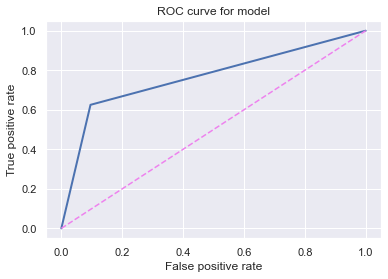

In [173]:
plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])


plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve for model')
plt.savefig('viz/roc_curve.svg');
print("ROC AUC score = ", roc_auc_score(y_holdout, gbm_final_preds))

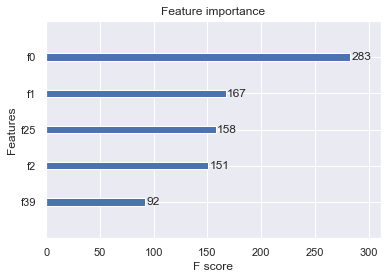

In [328]:
xgb.plot_importance(gbm_final,importance_type='weight',max_num_features=5)
labels = ['Last.fm Scrobbles', 'Last.fm Listeners', "Mean Speechiness", 'Label Strength', 'STD of Track Duration']
plt.savefig('viz/importance_weight.svg')

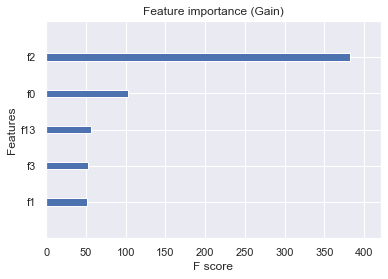

In [93]:
xgb.plot_importance(gbm_final, importance_type='gain',max_num_features=5,show_values=False,title='Feature importance (Gain)',)
labels = ['Label Strength', 'Last.fm Scrobbles', 'Review Delay', "Genre: Other", 'Last.fm Listeners']
plt.savefig('viz/importance_gain.svg')

https://towardsdatascience.com/can-we-predict-the-outcome-of-pitchfork-music-reviews-3b084d90c18f

Inspiratino for more viz in tableau

### Adding metrics to df to send to tableau

In [66]:
X_holdout.to_csv('data/final_holdout_raw.csv')

In [67]:
results_df = pd.read_csv('data/final_holdout_raw.csv')

In [68]:
results_df.rename(columns={'Unnamed: 0':'old_index'}, inplace=True)

In [69]:
results_df['bnm_preds'] = pd.Series(gbm_final_preds)

In [70]:
gbm_final_pred_probs = (gbm_final.predict_proba(X_holdout.values, ntree_limit=gbm_final.best_ntree_limit))[:,1]
results_df['bnm_pred_probs'] = pd.Series(gbm_final.predict_proba(X_holdout.values, ntree_limit=gbm_final.best_ntree_limit)[:,1])

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40'] ['f0', 'f1']
expected f19, f23, f29, f11, f26, f12, f15, f24, f30, f40, f8, f5, f10, f37, f18, f20, f9, f27, f17, f21, f31, f2, f36, f4, f14, f39, f7, f6, f3, f22, f28, f35, f33, f13, f16, f34, f25, f38, f32 in input data

In [71]:
results_df['bnm_pred_prob_diffs'] = results_df['bnm_pred_probs'].apply(lambda x: x - 0.673737)

KeyError: 'bnm_pred_probs'

In [72]:
results_df.head()

,old_index,scrobbles_lastfm,listeners_lastfm,bnm_preds
0,11464,4446469.0,197704.0,0
1,12604,2039046.0,89668.0,0
2,3634,28693.0,5099.0,0
3,4384,2895679.0,164763.0,0
4,11427,29872.0,4048.0,0


In [73]:
len(results_df)

2305

In [74]:
subset = df_bnm.loc[:,['best_new_music', 'album_artist_', 'artist_name_clean', 'album_title', 'album_review_score', 'album_release_year', 'album_genre', 'label']]
subset.head()

,best_new_music,album_artist_,artist_name_clean,album_title,album_review_score,album_release_year,album_genre,label
0,0,"the singles, goldfrapp",goldfrapp,the singles,8.4,2012.0,electronic,mute
1,0,"an exaltation of laarks, laarks",laarks,an exaltation of laarks,6.6,2009.0,rock,absolutely kosher
3,0,"into sixes, connections",connections,into sixes,6.8,2014.0,Other,anyway
4,0,"hold on love, azure ray",azure ray,hold on love,6.5,2003.0,rock,saddle creek
5,0,"life magazine remixes ep, cold cave",cold cave,life magazine remixes ep,7.3,2010.0,electronic,matador


In [75]:
merged_results = results_df.merge(subset, how='left', left_on='old_index', right_on=subset.index)


In [76]:
sonic_features = ['energy_mean', 'liveness_mean', 'danceability_mean', 'mode_mean', 'speechiness_mean', 'valence_mean', 'acousticness_mean', 'instrumentalness_mean']

In [77]:
for col in sonic_features:
    new_name = str(col+'_transformed')
    merged_results[new_name] = merged_results[col].apply(lambda x: x-0.5)

KeyError: 'energy_mean'

In [78]:
merged_results.head()

,old_index,scrobbles_lastfm,listeners_lastfm,bnm_preds,best_new_music,album_artist_,artist_name_clean,album_title,album_review_score,album_release_year,album_genre,label
0,11464,4446469.0,197704.0,0,0,"4, dungen",dungen,4,7.8,2008.0,rock,subliminal sounds
1,12604,2039046.0,89668.0,0,0,"joan of arc, dick cheney, mark twain..., joan ...",dick cheney,"joan of arc, dick cheney, mark twain...",5.3,2004.0,metal,polyvinyl
2,3634,28693.0,5099.0,0,0,"in the world of him, sally timms",sally timms,in the world of him,6.7,2004.0,rock,touch and go
3,4384,2895679.0,164763.0,0,0,"micah p. hinson and the gospel of progress, mi...",micah p. hinson,micah p. hinson and the gospel of progress,7.6,2005.0,rock,overcoat
4,11427,29872.0,4048.0,0,0,"actually, la big vic",la big vic,actually,7.3,2011.0,pop/r&b,underwater peoples


In [79]:
# exporting to csv to use in tableau

merged_results.to_csv('data/final_holdout_metrics.csv')